# Template Matching
## Finding Waldo - ค้นหา **`Waldo`** จากรูปภาพ

## อ่านรูปภาพจาก URL
### รูปภาพที่ใช้ค้นหา `Waldo`

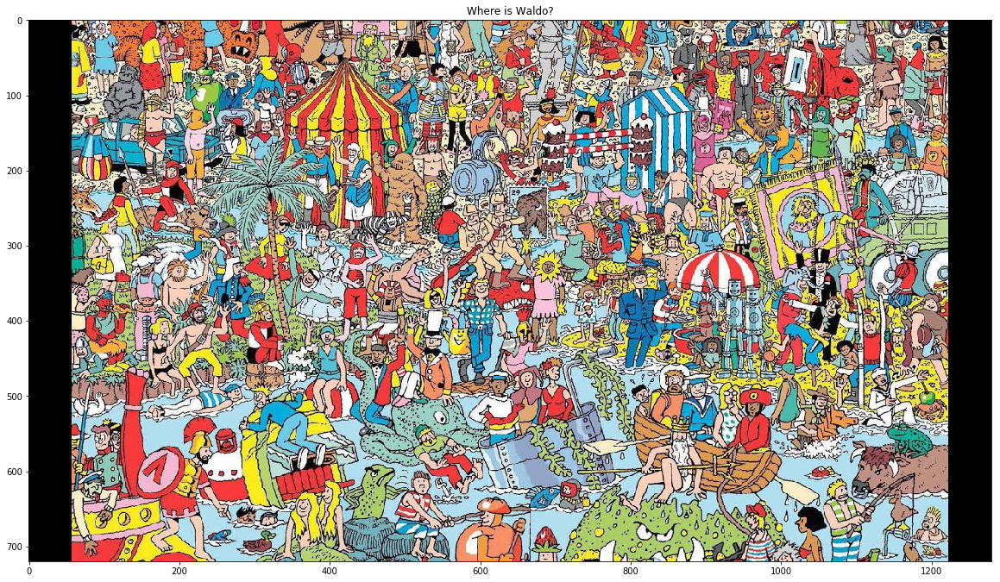

In [2]:
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt

img_url = 'https://raw.githubusercontent.com/k-choonkiat/TemplateMatching/master/find_waldo.jpg'
#img_url = 'http://ias.it.msu.ac.th/course/1201374-Image-processing/1-2562/find_waldo.jpg'

response = requests.get(img_url)
find_waldo_img = Image.open(BytesIO(response.content))

plt.figure(figsize=(20,20))
plt.title('Where is Waldo?')
plt.imshow(find_waldo_img)
plt.show()

## รูปภาพ `Waldo` ที่ใช้เป็น Template

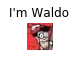

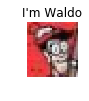

In [3]:
img_url = 'https://raw.githubusercontent.com/k-choonkiat/TemplateMatching/master/waldo.PNG'

response = requests.get(img_url)
waldo_img = Image.open(BytesIO(response.content))

plt.figure(figsize=(0.5,0.5))
plt.axis('off')
plt.title("I'm Waldo")
plt.imshow(waldo_img)
plt.show()

plt.figure(figsize=(1,1))
plt.axis('off')
plt.title("I'm Waldo")
plt.imshow(waldo_img)
plt.show()

## ค้นหารูปภาพด้วย Template Matching

In [0]:
import cv2
import numpy as np
from matplotlib import pyplot as plt


find_waldo_img = np.array(find_waldo_img)
found_waldo_img = np.copy(find_waldo_img)
template_waldo_img = np.array(waldo_img)

find_waldo_gray_img = cv2.cvtColor(find_waldo_img, cv2.COLOR_BGR2GRAY)
template_waldo_gray_img = cv2.cvtColor(template_waldo_img, cv2.COLOR_BGR2GRAY)

# saves the width and height of the template into 'w' and 'h'
w,h = template_waldo_gray_img.shape[::-1]


res = cv2.matchTemplate(find_waldo_gray_img,template_waldo_gray_img,cv2.TM_CCOEFF_NORMED)
threshold = 0.6
# finding the values where it exceeds the threshold
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    #draw rectangle on places where it exceeds threshold
    cv2.rectangle(found_waldo_img, pt, (pt[0] + w, pt[1] + h), (0,255,0), 2)


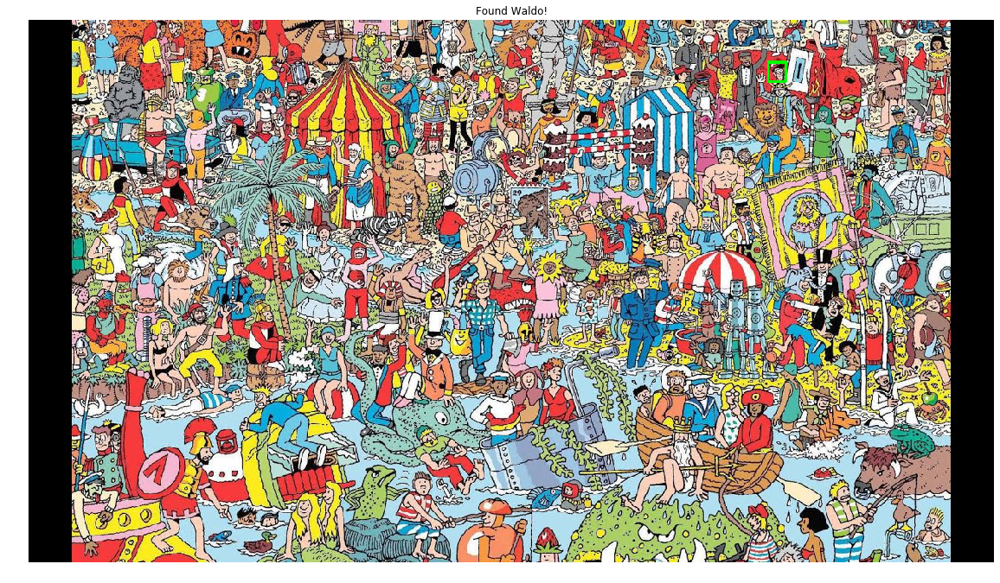

In [13]:
plt.figure(figsize=(20,20))
plt.axis('off')
plt.title('Found Waldo!')
plt.imshow(found_waldo_img)
plt.show()

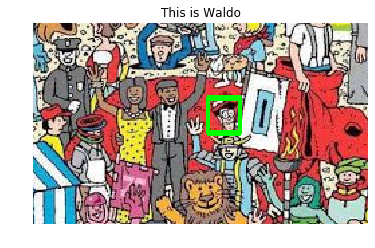

In [14]:
plt.title('This is Waldo')
plt.axis('off')
plt.imshow(found_waldo_img[0:150,850:1100])
plt.show()

## สร้างฟังก์ชัน (Function) เพื่อใช้งาน

In [0]:
from PIL import Image
import requests
from io import BytesIO
import numpy as np

def read_img_url(img_url, show_img=False):
  response = requests.get(img_url)
  img = Image.open(BytesIO(response.content))
  img = np.array(img)
  
  if(show_img):
    plt.figure(figsize=(20,20))
    plt.title('IMAGE')
    plt.imshow(img)
    plt.show()
  
  return img


def convert_to_gray(color_img):
  gray_img = cv2.cvtColor(color_img, cv2.COLOR_BGR2GRAY)
  
  return gray_img  


def template_matching(img, gray_template_img, threshold=0.6):
  found_img = np.copy(img)
  gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  
  # saves the width and height of the template into 'w' and 'h'
  w,h = gray_template_img.shape[::-1]
  
  res = cv2.matchTemplate(gray_img, gray_template_img, cv2.TM_CCOEFF_NORMED)
  #threshold = 0.6
  # finding the values where it exceeds the threshold
  loc = np.where( res >= threshold)
  for pt in zip(*loc[::-1]):
    #draw rectangle on places where it exceeds threshold
    cv2.rectangle(found_img, pt, (pt[0] + w, pt[1] + h), (0,255,0), 2)
    
  return found_img

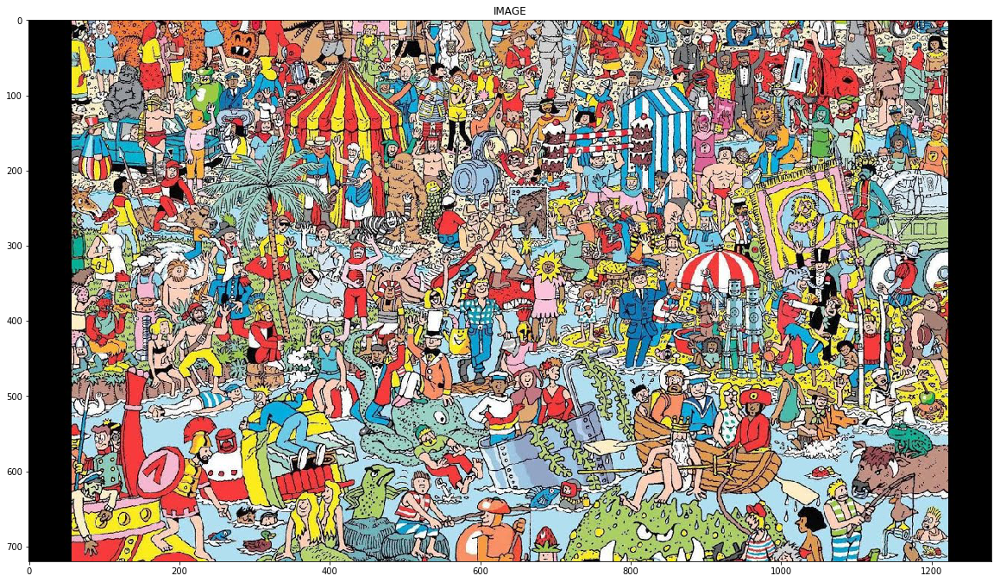

In [9]:
img_url = 'https://raw.githubusercontent.com/k-choonkiat/TemplateMatching/master/find_waldo.jpg'
img = read_img_url(img_url, show_img=True)
img_gray = convert_to_gray(img)

## การเลือกรูปภาพ Template ด้วยวิธีการครอป (Crop) หรือการ Slicing จาก Array - Slicing to select the template

### Example 1

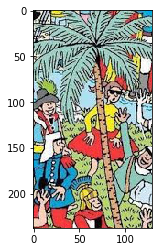

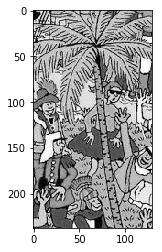

In [0]:
template_img = img[182:420, 250:380]
plt.imshow(template_img)
plt.show()

template_img_gray = convert_to_gray(template_img)
plt.gray()
plt.imshow(template_img_gray)
plt.show()

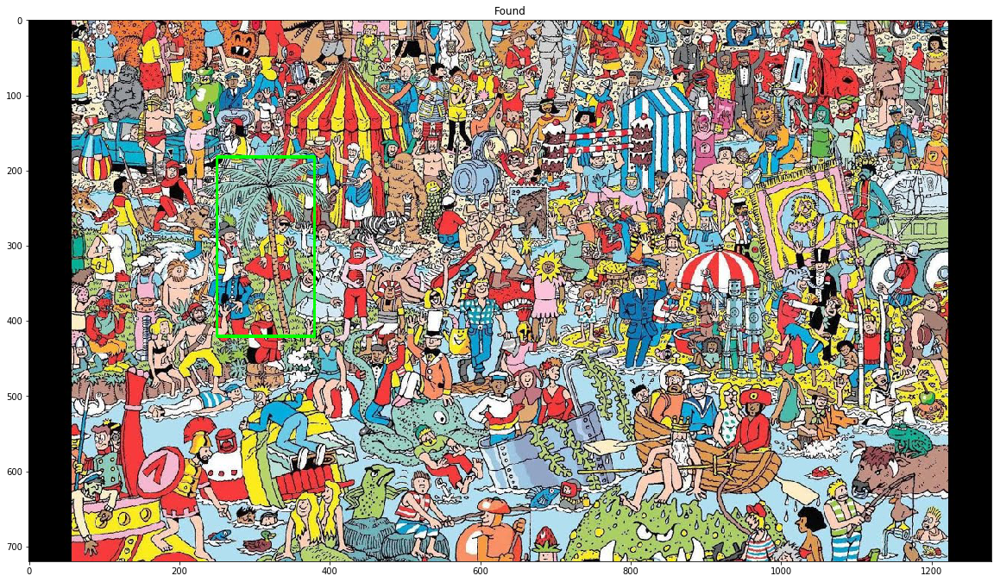

In [0]:
found_img = template_matching(img, template_img_gray, threshold=0.6)

plt.figure(figsize=(20,20))
plt.title('Found')
plt.imshow(found_img)
plt.show()

### Example 2

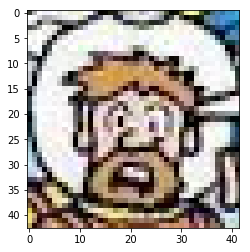

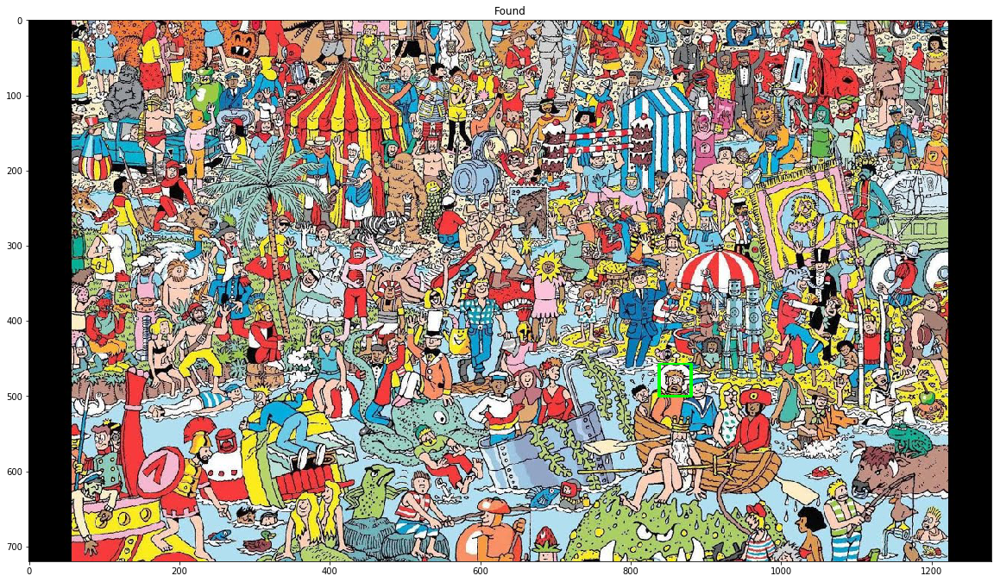

In [0]:
img_url = 'https://raw.githubusercontent.com/k-choonkiat/TemplateMatching/master/find_waldo.jpg'
img = read_img_url(img_url, show_img=False)
img_gray = convert_to_gray(img)

template_img = img[457:500, 838:880]
template_img_gray = convert_to_gray(template_img)

plt.imshow(template_img)
plt.show()

found_img = template_matching(img, template_img_gray, threshold=0.6)

plt.figure(figsize=(20,20))
plt.title('Found')
plt.imshow(found_img)
plt.show()

Readme
* https://pysource.com/2018/03/05/template-matching-opencv-3-4-with-python-3-tutorial-20/
* Find waldo - https://medium.com/analytics-vidhya/finding-waldo-feature-matching-for-opencv-9bded7f5ab10